In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from dfply import *
from statsmodels.stats.outliers_influence import variance_inflation_factor

%matplotlib inline

In [2]:
df = pd.read_csv("./data/heart.csv")

In [3]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [4]:
df.shape

(918, 12)

In [5]:
df.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [6]:
df.dtypes

Age                 int64
Sex                object
ChestPainType      object
RestingBP           int64
Cholesterol         int64
FastingBS           int64
RestingECG         object
MaxHR               int64
ExerciseAngina     object
Oldpeak           float64
ST_Slope           object
HeartDisease        int64
dtype: object

In [7]:
df.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

In [8]:
obj_cols = [i for i in df.columns if df[i].dtype == 'O']
for i in obj_cols:
    print((i + ":"),df[i].unique())

Sex: ['M' 'F']
ChestPainType: ['ATA' 'NAP' 'ASY' 'TA']
RestingECG: ['Normal' 'ST' 'LVH']
ExerciseAngina: ['N' 'Y']
ST_Slope: ['Up' 'Flat' 'Down']


In [16]:
obj_cols.index("ExerciseAngina")

3

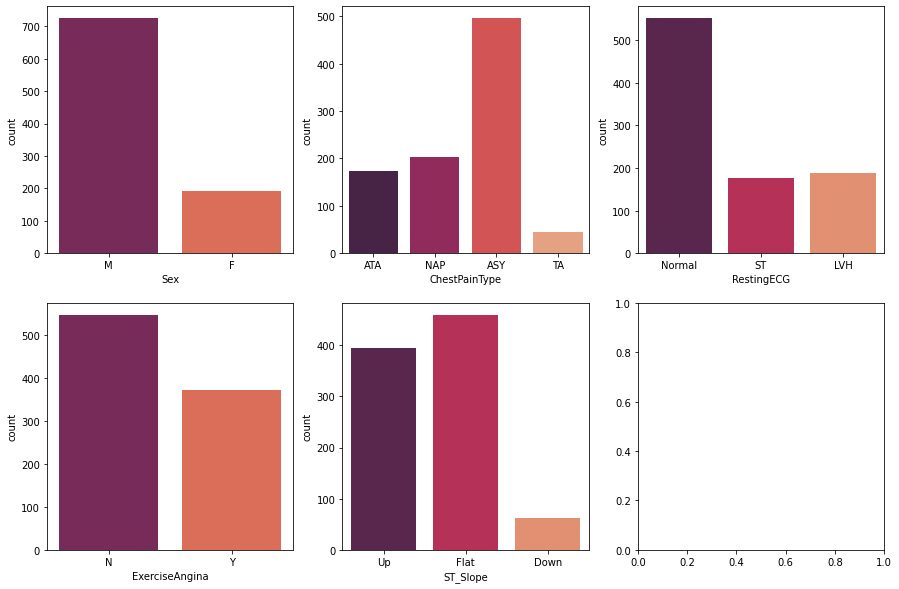

In [17]:
f, axes = plt.subplots(2, 3, figsize=(15, 10))

for i in obj_cols:
    if obj_cols.index(i) <= 2:
        k = 0
        j = obj_cols.index(i)
    elif obj_cols.index(i) > 2:
        k = 1
        j = obj_cols.index(i) - 3

    sns.countplot(x = df[i], data = df, palette='rocket', ax=axes[k,j])

plt.show()

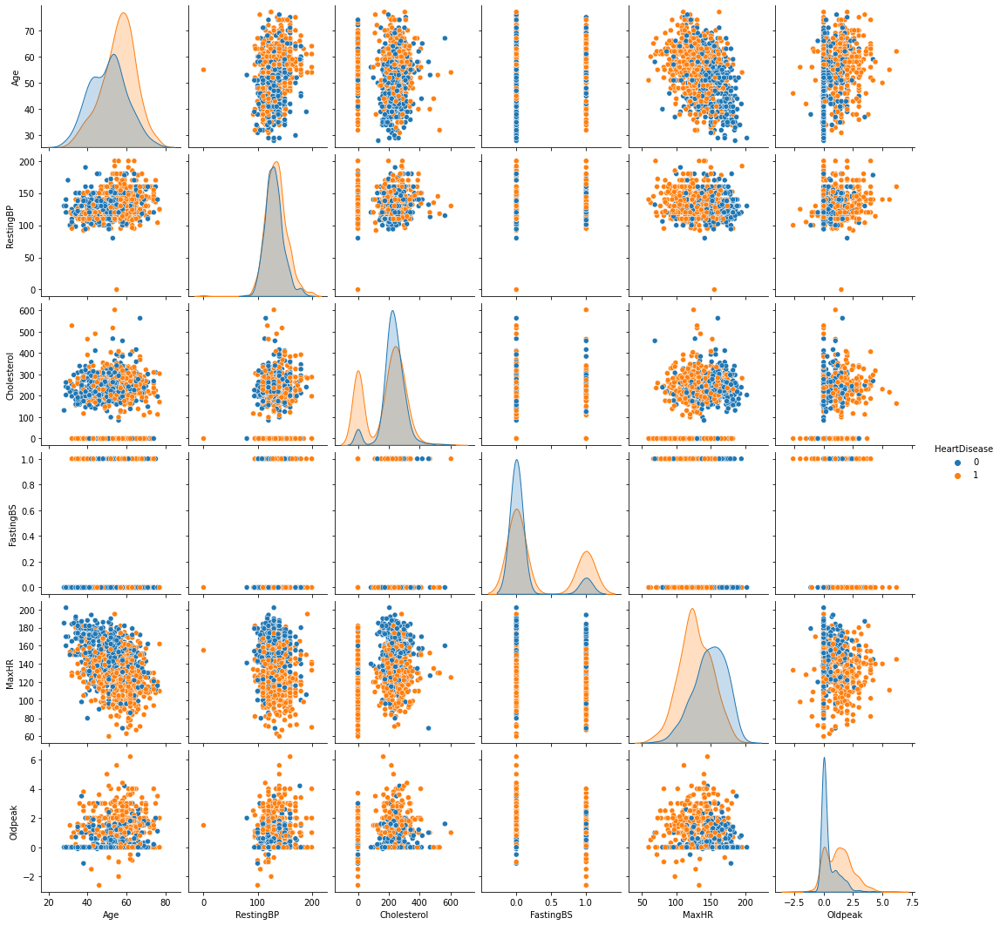

In [18]:
sns.pairplot(df,hue='HeartDisease')

<AxesSubplot:>

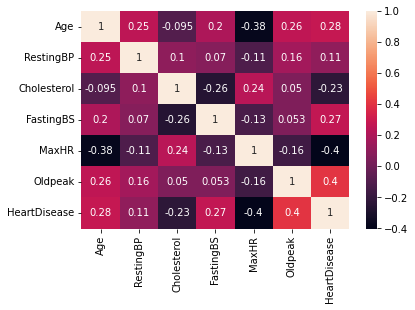

In [19]:
sns.heatmap(df.corr(),annot=True)

<AxesSubplot:xlabel='HeartDisease', ylabel='Age'>

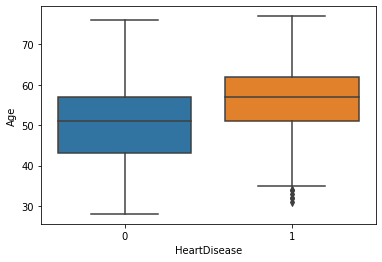

In [20]:
sns.boxplot(y="Age",data=df,x="HeartDisease")

<AxesSubplot:xlabel='HeartDisease', ylabel='MaxHR'>

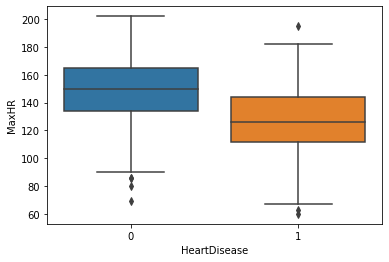

In [21]:
sns.boxplot(y="MaxHR",data=df,x="HeartDisease")

<AxesSubplot:xlabel='HeartDisease', ylabel='RestingBP'>

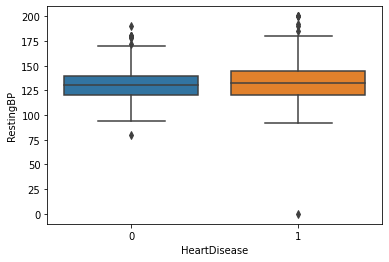

In [22]:
sns.boxplot(y="RestingBP",data=df,x="HeartDisease")

<AxesSubplot:xlabel='HeartDisease', ylabel='Oldpeak'>

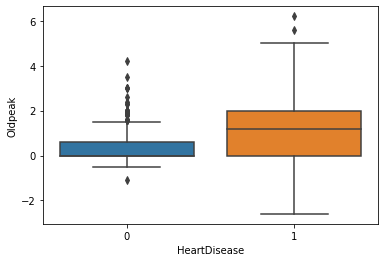

In [23]:
sns.boxplot(y="Oldpeak",data=df,x="HeartDisease")

<AxesSubplot:xlabel='HeartDisease', ylabel='Count'>

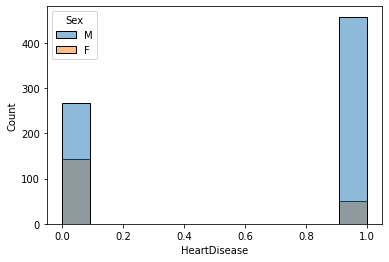

In [24]:
sns.histplot(x="HeartDisease",data=df,hue="Sex")

<AxesSubplot:title={'center':'Correlation with the response variable'}>

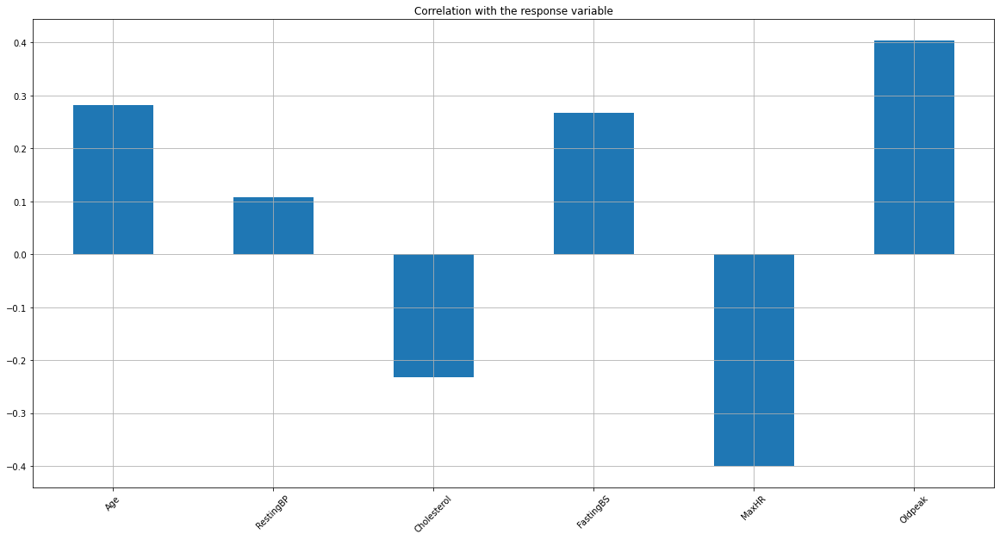

In [25]:
df.drop(columns = ['HeartDisease']).corrwith(df.HeartDisease).plot.bar(figsize = (20,10), grid = True, rot = 45, title='Correlation with the response variable')

In [48]:
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [27]:
obj_cols = [i for i in df.columns if df[i].dtype == 'O']
label_enc = LabelEncoder()
for i in obj_cols:
    df[i] = label_enc.fit_transform(df[i])

In [28]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,0,0.0,2,0
1,49,0,2,160,180,0,1,156,0,1.0,1,1
2,37,1,1,130,283,0,2,98,0,0.0,2,0
3,48,0,0,138,214,0,1,108,1,1.5,1,1
4,54,1,2,150,195,0,1,122,0,0.0,2,0


In [29]:
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [30]:
X = df.drop(columns="HeartDisease")
calc_vif(X)

,variables,VIF
0,Age,30.261977
1,Sex,4.912441
2,ChestPainType,1.991361
3,RestingBP,46.835556
4,Cholesterol,5.227740
5,FastingBS,1.482939
6,RestingECG,3.535198
7,MaxHR,26.142683
8,ExerciseAngina,2.521587
9,Oldpeak,2.543331


In [31]:
y=df["HeartDisease"]

In [32]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
X

array([[-1.4331398 ,  0.51595242,  0.22903206, ..., -0.8235563 ,
        -0.83243239,  1.05211381],
       [-0.47848359, -1.93816322,  1.27505906, ..., -0.8235563 ,
         0.10566353, -0.59607813],
       [-1.75135854,  0.51595242,  0.22903206, ..., -0.8235563 ,
        -0.83243239,  1.05211381],
       ...,
       [ 0.37009972,  0.51595242, -0.81699495, ...,  1.21424608,
         0.29328271, -0.59607813],
       [ 0.37009972, -1.93816322,  0.22903206, ..., -0.8235563 ,
        -0.83243239, -0.59607813],
       [-1.64528563,  0.51595242,  1.27505906, ..., -0.8235563 ,
        -0.83243239,  1.05211381]])

In [33]:
pca = PCA()
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents[:,:2]
             , columns = ['principal component 1', 'principal component 2'])


Text(0, 0.5, 'cumulative explained variance')

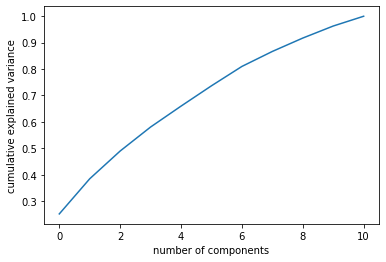

In [34]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [35]:
finalDf = pd.concat([principalDf, df[['HeartDisease']]], axis = 1)

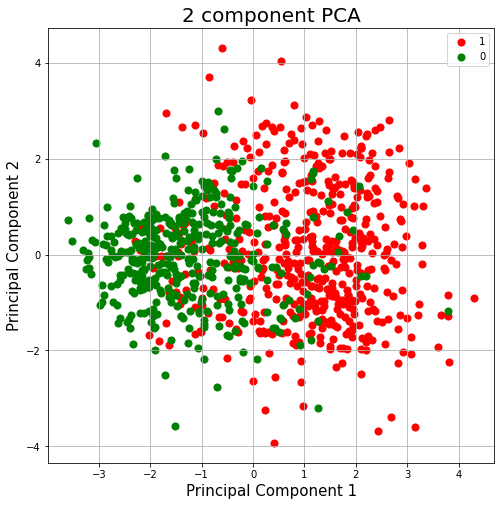

In [36]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [1, 0]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['HeartDisease'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [37]:
def best_model(X, y, algo):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=True)
    
    X_train = np.asarray(X_train)
    X_test = np.asarray(X_test)
    
    y_train = np.asarray(y_train)
    y_test = np.asarray(y_test)

    model = algo()
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    
    training_score = model.score(X_train, y_train)
    acc = accuracy_score(y_test, predictions)
    con = confusion_matrix(y_test, predictions)
    report = classification_report(y_test, predictions)
    print(f'Training Score: {training_score}')
    print(f'Accuracy Score: {acc}')
    print(f'Confusion Matrix: {con}')
    print(f'Classification Report: {report}')
    return acc, training_score

In [38]:
list_algo = [KNeighborsClassifier, DecisionTreeClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier]

list_of_accuracy = []
list_of_score = []

for i in list_algo:
    accuracyscore, trainingscore = best_model(X, y, i)
    list_of_accuracy.append(accuracyscore)
    list_of_score.append(trainingscore) 

Training Score: 0.8808139534883721
Accuracy Score: 0.8739130434782608
Confusion Matrix: [[ 88  15]
 [ 14 113]]
Classification Report:               precision    recall  f1-score   support

           0       0.86      0.85      0.86       103
           1       0.88      0.89      0.89       127

    accuracy                           0.87       230
   macro avg       0.87      0.87      0.87       230
weighted avg       0.87      0.87      0.87       230

Training Score: 1.0
Accuracy Score: 0.7913043478260869
Confusion Matrix: [[92 21]
 [27 90]]
Classification Report:               precision    recall  f1-score   support

           0       0.77      0.81      0.79       113
           1       0.81      0.77      0.79       117

    accuracy                           0.79       230
   macro avg       0.79      0.79      0.79       230
weighted avg       0.79      0.79      0.79       230

Training Score: 1.0
Accuracy Score: 0.8913043478260869
Confusion Matrix: [[ 83  16]
 [  9 122]]
C

In [39]:
model = RandomForestClassifier(n_estimators=10)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=True)

model.fit(X_train, y_train)
# Extract single tree
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = df.loc[:,:"ST_Slope"].columns,
                class_names = "HeartDisease",
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.841085 to fit


In [40]:
model = RandomForestClassifier()
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [41]:
from sklearn.model_selection import RandomizedSearchCV, RepeatedStratifiedKFold
model = RandomForestClassifier()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=True)

# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=1)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

# define search
search = RandomizedSearchCV(model, random_grid, n_iter=100, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)

# execute search
result = search.fit(X_train, y_train)

# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.8778665814151747
Best Hyperparameters: {'n_estimators': 1200, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 70, 'bootstrap': True}


In [46]:
model = RandomForestClassifier()
model.set_params(n_estimators=1200,
                 max_features= 'sqrt',
                 max_depth= 70,
                 min_samples_split= 2,
                 min_samples_leaf= 4,
                 bootstrap= True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=True)

model.fit(X_train,y_train)
predictions = model.predict(X_test)
accuracy_score(y_test, predictions)

0.8913043478260869

In [51]:
from catboost import CatBoostClassifier

In [53]:
accuracy =[]
model_names =[]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = CatBoostClassifier(verbose=False,random_state=0)

model.fit(X_train, y_train,eval_set=(X_test, y_test))
y_pred = model.predict(X_test)
accuracy.append(round(accuracy_score(y_test, y_pred),4))

model_names = ['Catboost_default']
result = pd.DataFrame({'Accuracy':accuracy}, index=model_names)
result

,Accuracy
Catboost_default,0.9022


In [58]:
import optuna
def objective(trial):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    param = {
        "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 12),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical(
            "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
        ),
        "used_ram_limit": "3gb",
    }

    if param["bootstrap_type"] == "Bayesian":
        param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif param["bootstrap_type"] == "Bernoulli":
        param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    cat_cls = CatBoostClassifier(**param)

    cat_cls.fit(X_train, y_train, eval_set=[(X_test, y_test)],verbose=0, early_stopping_rounds=100)

    preds = cat_cls.predict(X_test)
    pred_labels = np.rint(preds)
    accuracy = accuracy_score(y_test, pred_labels)
    return accuracy

if __name__ == "__main__":
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=50, timeout=600)

    print("Number of finished trials: {}".format(len(study.trials)))

    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))

    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))

[I 2021-10-15 16:05:01,881] A new study created in memory with name: no-name-1cfc4ec7-6eee-4e92-967d-cc06dc8187ba
[I 2021-10-15 16:05:02,256] Trial 0 finished with value: 0.8913043478260869 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.09855093462571678, 'depth': 12, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 8.894749734621428}. Best is trial 0 with value: 0.8913043478260869.
[I 2021-10-15 16:05:02,724] Trial 1 finished with value: 0.8876811594202898 and parameters: {'objective': 'CrossEntropy', 'colsample_bylevel': 0.04843623655843418, 'depth': 4, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 4.674513550285208}. Best is trial 0 with value: 0.8913043478260869.
[I 2021-10-15 16:05:03,171] Trial 2 finished with value: 0.8876811594202898 and parameters: {'objective': 'Logloss', 'colsample_bylevel': 0.06656742638710206, 'depth': 10, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_tem

Number of finished trials: 50
Best trial:
  Value: 0.9094202898550725
  Params: 
    objective: CrossEntropy
    colsample_bylevel: 0.08189107381290878
    depth: 6
    boosting_type: Plain
    bootstrap_type: Bernoulli
    subsample: 0.8116019692580849


In [59]:
accuracy =[]
model_names =[]


X= df.drop('HeartDisease', axis=1)
y= df['HeartDisease']
categorical_features_indices = np.where(X.dtypes != np.float)[0]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = CatBoostClassifier(verbose=False,random_state=0,
                          objective= 'CrossEntropy',
    colsample_bylevel= 0.08189107381290878,
    depth= 6,
    boosting_type= 'Plain',
    bootstrap_type= 'Bernoulli',
    subsample=0.8116019692580849)

model.fit(X_train, y_train,eval_set=(X_test, y_test))
y_pred = model.predict(X_test)
accuracy.append(round(accuracy_score(y_test, y_pred),4))
print(classification_report(y_test, y_pred))

model_names = ['Catboost_tuned']
result = pd.DataFrame({'Accuracy':accuracy}, index=model_names)
result

/var/folders/86/_czxb88d1vs6dlr9r1cb7mh80000gn/T/ipykernel_53581/294969909.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  categorical_features_indices = np.where(X.dtypes != np.float)[0]


              precision    recall  f1-score   support

           0       0.87      0.92      0.89       112
           1       0.94      0.90      0.92       164

    accuracy                           0.91       276
   macro avg       0.90      0.91      0.91       276
weighted avg       0.91      0.91      0.91       276



,Accuracy
Catboost_tuned,0.9094


In [ ]:
blank_cols = df.columns[df.isnull().any()].tolist()
df.drop(columns=blank_cols)

In [ ]:
from sklearn.impute import SimpleImputer

# Fill in the lines below: imputation
my_imputer = SimpleImputer() # Your code here
imputed_X_train = pd.DataFrame(my_imputer.fit_transform(X_train))
imputed_X_valid = pd.DataFrame(my_imputer.transform(X_valid))

# Fill in the lines below: imputation removed column names; put them back
imputed_X_train.columns = X_train.columns
imputed_X_valid.columns = X_valid.columns

In [ ]:
drop_X_train = X_train.select_dtypes(exclude=['object'])
drop_X_valid = X_valid.select_dtypes(exclude=['object'])

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
s = (X_train.dtypes == 'object')
object_cols = list(s[s].index)

label_X_train = X_train.copy()
label_X_valid = X_valid.copy()

ordinal_encoder = OrdinalEncoder()
label_X_train[object_cols] = ordinal_encoder.fit_transform(X_train[object_cols])
label_X_valid[object_cols] = ordinal_encoder.transform(X_valid[object_cols])

In [ ]:
# Get number of unique entries in each column with categorical data
object_nunique = list(map(lambda col: X_train[col].nunique(), object_cols))
d = dict(zip(object_cols, object_nunique))

# Print number of unique entries by column, in ascending order
sorted(d.items(), key=lambda x: x[1])

In [ ]:
high_cardinality_numcols = len({ key:value for key, value in d.items() if value > 10 })
d.get('Neighborhood')

In [ ]:
# Columns that will be one-hot encoded
low_cardinality_cols = [col for col in object_cols if X_train[col].nunique() < 10]

# Columns that will be dropped from the dataset
high_cardinality_cols = list(set(object_cols)-set(low_cardinality_cols))

print('Categorical columns that will be one-hot encoded:', low_cardinality_cols)
print('\nCategorical columns that will be dropped from the dataset:', high_cardinality_cols)

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Apply one-hot encoder to each column with categorical data
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(X_train[low_cardinality_cols]))
OH_cols_valid = pd.DataFrame(OH_encoder.transform(X_valid[low_cardinality_cols]))

# One-hot encoding removed index; put it back
OH_cols_train.index = X_train.index
OH_cols_valid.index = X_valid.index

# Remove categorical columns (will replace with one-hot encoding)
num_X_train = X_train.drop(object_cols, axis=1)
num_X_valid = X_valid.drop(object_cols, axis=1)

# Add one-hot encoded columns to numerical features
OH_X_train = pd.concat([num_X_train, OH_cols_train], axis=1)
OH_X_valid = pd.concat([num_X_valid, OH_cols_valid], axis=1)